# Tarea 3. Míneria de Texto Básica

Procesamiento de Lenguaje Natural

Eric Lemus Avalos 


In [112]:
import os
import math 
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import nltk
from nltk.tokenize import TweetTokenizer
from collections import defaultdict

from sklearn.preprocessing import normalize
from sklearn.manifold import TSNE

from sklearn import svm
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score, precision_recall_fscore_support, roc_auc_score


#### Cargamos las funciones necesarias del proyecto anterior

In [4]:
def get_text_from_file(path_file: str, target_file: str, tokenizer = TweetTokenizer()) -> list:
    file_txt = []
    target_txt = []

    with open(path_file, 'r', encoding="utf8") as f_corpus, open(target_file, 'r', encoding="utf8") as f_target:
        for tweet in f_corpus:
            file_txt += [tokenizer.tokenize(tweet)]
        for target in f_target:
            target_txt += [target]
    
    target_txt = list(map(int, target_txt))
    
    return file_txt, target_txt

def order_dic_frec(fdic):
    aux = [(fdic[key], key) for key in fdic]
    aux.sort()
    aux.reverse()
    return aux

def create_vocab(tr_txt, n=5000):
    corpus_palabras = []
    for doc in tr_txt:
        corpus_palabras += doc
    
    fdist = nltk.FreqDist(corpus_palabras)
    vocab = order_dic_frec(fdist)
    vocab  = vocab [:n]
    
    return vocab

def BoW_tfidf(text, vocabulario, dict_index):
    BOW = np.zeros((len(text), len(vocabulario)), dtype=float)
    
    df = defaultdict(int)  # df[word] = num de doc donde aparece la palabra
    for doc in text:
        unique_words = set(doc)  
        for word in unique_words:
            if word in dict_index:
                df[word] += 1  
    
    cont_doc = 0
    T = len(text)  # total doc
    
    for doc in text:
        fdist_doc = nltk.FreqDist(doc)  
        
        for word in fdist_doc:
            if word in dict_index:
                tf = fdist_doc[word]
                idf = np.log(T / df[word])
                BOW[cont_doc, dict_index[word]] = tf * idf
        cont_doc += 1
    
    return BOW

In [5]:
file_txt_train, target_txt_train = get_text_from_file("../tarea_2/data_mex/mex20_train.txt", "../tarea_2/data_mex/mex20_train_labels.txt")
file_txt_val, target_txt_val = get_text_from_file("../tarea_2/data_mex/mex20_val (1).txt", "../tarea_2/data_mex/mex20_val_labels (1).txt")

In [6]:
V = create_vocab(file_txt_train)

dict_index = dict()
count = 0
for weight, word in V:
    dict_index[word] = count
    count += 1

### **1. Programa y visualiza TCOR**

Para TCOR primero creamos una matrix de co-ocurrencia que se base en la presencia de términos en el mismo documento. Mientras que el pesado se empleará el propuesto por el profesor

$$w_{k,j} = tff(t_k,t_j) \log{\frac{|T|}{T_k}}$$


$$
tff(t_k,t_j) =
\begin{cases} 
1 + \log(\#(t_k,t_j)) & \text{si } \#(t_k,t_j) > 0 \\
0 & \text{si } \#(d_k, t_j) = 0
\end{cases}
$$




In [56]:
def termterm_matrix(text_train, dict_index):
    """
    Crea una maatriz de co-ocurrencia 
    """
    size = len(dict_index)
    cooccurrence = np.zeros((size, size), dtype=int)
    
    for doc in text_train:
        indices = [dict_index[word] for word in doc if word in dict_index]
        for i, idx1 in enumerate(indices):
            for idx2 in indices[i:]:
                cooccurrence[idx1, idx2] += 1
                if idx1 != idx2:
                    cooccurrence[idx2, idx1] += 1

    return cooccurrence


def tcor_term(text_train, dict_idx):
    """
    Calcula la TCOR término-término de tamaño |V| x |V| a partir de la matriz de co-ocurrencia.
    """
    T = len(dict_idx)
    cooccurrence_matrix = termterm_matrix(text_train,dict_idx)
    TCOR = np.zeros_like(cooccurrence_matrix, dtype=np.float64)

    for k in range(T):
        nonzero_indices = np.nonzero(cooccurrence_matrix[k])[0] 
        T_k = len(nonzero_indices)  
        
        if T_k > 0:
            for j in nonzero_indices:
                tff = 1 + math.log10(cooccurrence_matrix[k, j])
                TCOR[k, j] = tff * math.log10(T / T_k)
    
    return TCOR


def tcor_doc(tr_txt, dict_idx, tcor_term):
    """
    Calcula la matriz TCOR documento-término.
    
    Args:
        tr_txt (list of list of str): Lista de documentos, donde cada documento es una lista de palabras.
        dict_idx (dict): Un diccionario que mapea palabras a índices.
    
    Returns:
        np.ndarray: Matriz TCOR documento-término.
    """
    TCOR_term = tcor_term.copy()  
    TCOR_doc = np.zeros((len(tr_txt), len(dict_idx)), dtype=np.float64)
    
    for n_doc, doc in enumerate(tr_txt):
        indices = [dict_idx[w] for w in doc if w in dict_idx] 
        if indices:  # Evitar div por cero
            TCOR_doc[n_doc] = np.sum(TCOR_term[indices], axis=0) / len(indices)
    
    return TCOR_doc

In [57]:
tcor_term = normalize(tcor_term(file_txt_train,dict_index), norm='l2', axis=1)

Utilizamos tsne para reducir la dimensinalidad 

In [59]:
reduced_tcor = TSNE(2).fit_transform(tcor_term) 

In [10]:
def constelacion(reduced_tcor, V):
    max_x, max_y = np.amax(reduced_tcor, axis=0)
    plt.figure(figsize=(40,40), dpi=100); plt.xlim((-max_x, max_x)); plt.ylim((-max_y,max_y))
    plt.title("Representacion TCOR")
    plt.scatter(reduced_tcor[:,0], reduced_tcor[:,1], 20, color='blue')

    for idx, w in enumerate(V):
        x = reduced_tcor[idx, 0]
        y = reduced_tcor[idx, 1]
        plt.annotate(w, (x,y), color='black')
    plt.show

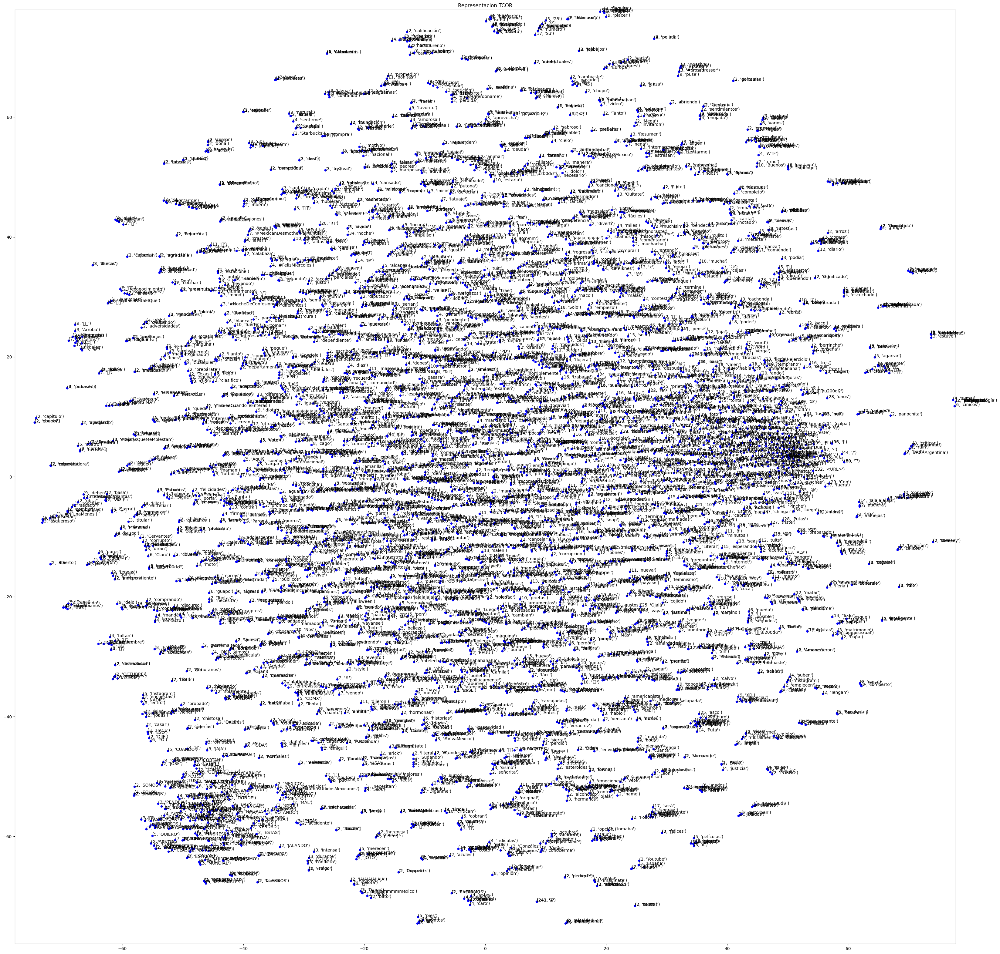

In [11]:
import warnings
warnings.filterwarnings("ignore", message="Glyph.*missing from font")
constelacion(reduced_tcor, V)

In [13]:
def subset_arrow(reduced_tcor, subset, dict_index):
    fig, ax = plt.subplots(figsize=(15, 15))
    plt.title("Representación vectorial de palabras")

    for word in subset:
        if word in dict_index:
            idx = dict_index[word]
            x, y = reduced_tcor[idx]  
            plt.annotate(word, (x, y), color='black')
            ax.arrow(0, 0, x, y, head_width=0.05, head_length=0.1, fc="r", ec="r", width=0.01)

    plt.scatter(reduced_tcor[[dict_index[w] for w in subset if w in dict_index], 0],
                reduced_tcor[[dict_index[w] for w in subset if w in dict_index], 1],color='blue', s=20)
    ax.set_xlim([min(reduced_tcor[:, 0]) - 1, max(reduced_tcor[:, 0]) + 1])
    ax.set_ylim([min(reduced_tcor[:, 1]) - 1, max(reduced_tcor[:, 1]) + 1])
    plt.show()

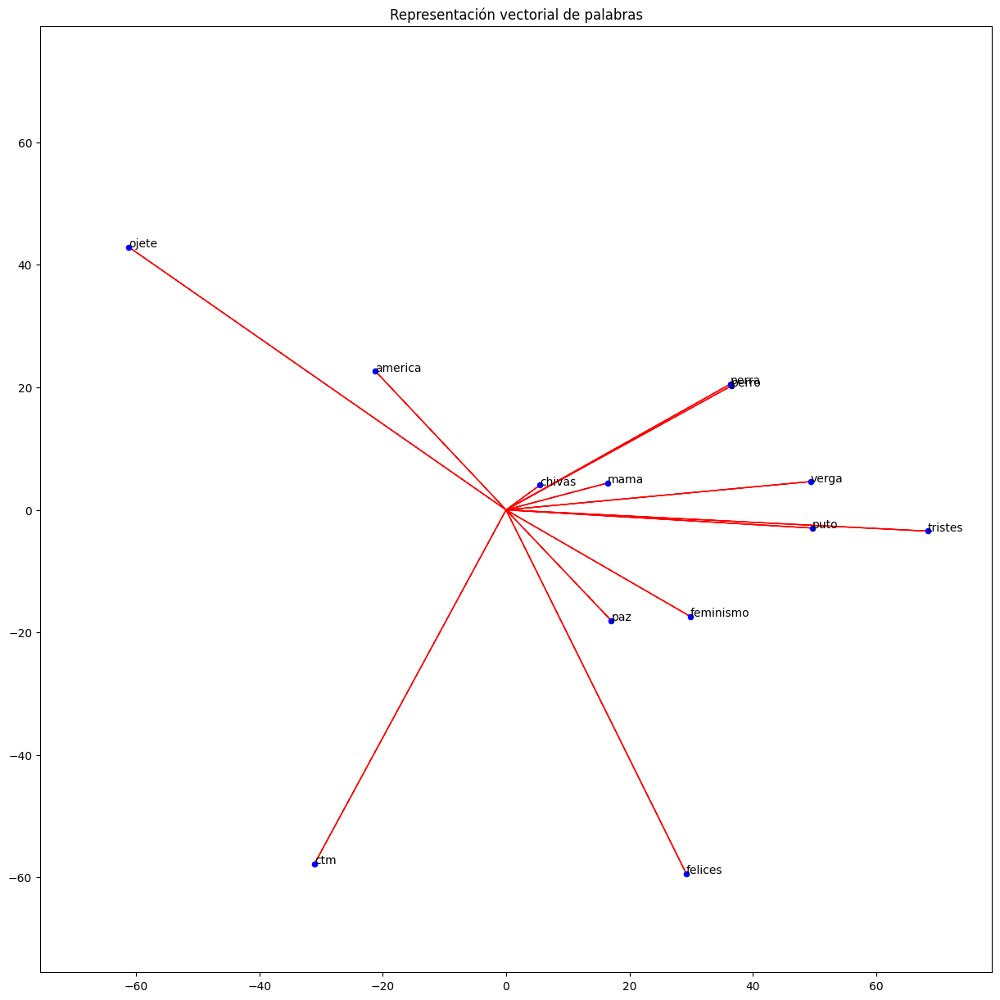

In [14]:
subset = ['america', 'cholo', 'puto', 'perro', 'chivas', 'mama', 'tristes', 'cage' 
          'guerra', 'paz', 'perra', 'verga', 'ctm', 'felices', 'feminismo', 'ojete']

subset_arrow(reduced_tcor, subset, dict_index)

El gráfico de constelación muestra una nube de palabras densamente agrupadas, donde se pueden identificar dos pequeños conglomerados. Dado que este método se basa en la hipótesis distribucional, las palabras representadas con flechas tienden a aparecer en contextos similares. En particular, aquellas con un ángulo más reducido entre sí ocurren con mayor frecuencia en los mismos entornos lingüísticos para el conjunto de datos, por ejemplo; podemos ver que la norma de los vectores puto y verga es muy parecida al igual que su dirección, muchas veces estas palabras van en el mismo tweet.  

### **2. Programa y visualiza alguna implementación de Random Indexing**

In [13]:
def random_indexing(text_train, k=100, p=0.2):
    """
    Genera una matriz de Random Indexing.
    
    Parámetros:
        tr_txt: Lista de documentos.
        k: Tamaño del vector aleatorio.
        p: Probabilidad de asignar valores 1 o -1.
    """
    random_idx = np.zeros((len(text_train), k), dtype=float)
    
    for i in range(len(text_train)):
        indices = np.random.choice(k, size=int(k * p), replace=False)
        values = np.random.choice([-1, 1], size=int(k * p))
        random_idx[i, indices] = values
    
    return random_idx

def RI_term(text_train, dict_index, k=100, p=0.2):
    """
    Calcula la representación de Random Indexing agrupada por términos.
    """
    random_idx = random_indexing(text_train, k, p)
    RI_term_matrix = np.zeros((len(dict_index), k), dtype=float)
    idf = np.zeros(len(dict_index))
    
    for w, idx in dict_index.items():
        for n_doc, doc in enumerate(text_train):
            if w in doc:
                idf[idx] += 1
                RI_term_matrix[idx] += random_idx[n_doc]
    
    idf[idf == 0] = 1
    idf = np.log(len(text_train) / idf)
    
    return RI_term_matrix, idf



In [14]:
RI_ter = normalize(RI_term(file_txt_train, dict_index, 100, 0.2)[0])

In [15]:
reduced_RI = TSNE(2).fit_transform(RI_ter) 

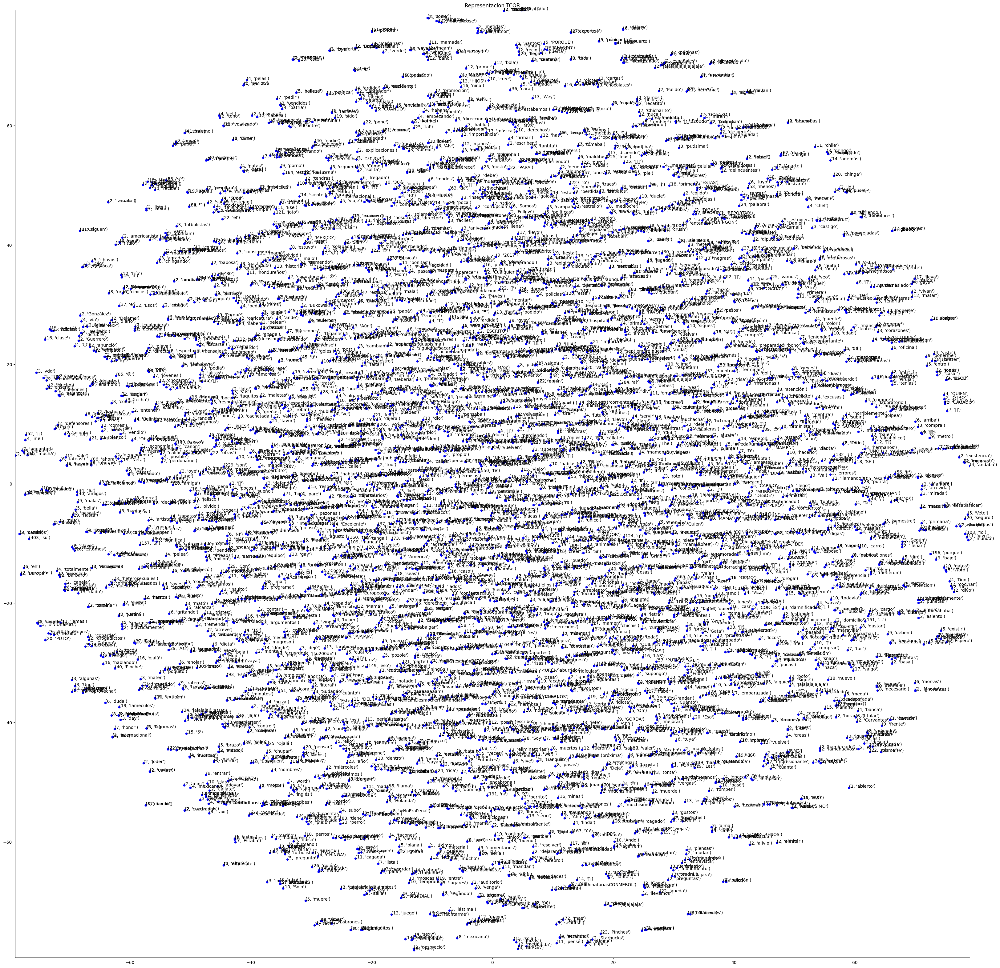

In [16]:
constelacion(reduced_RI, V)

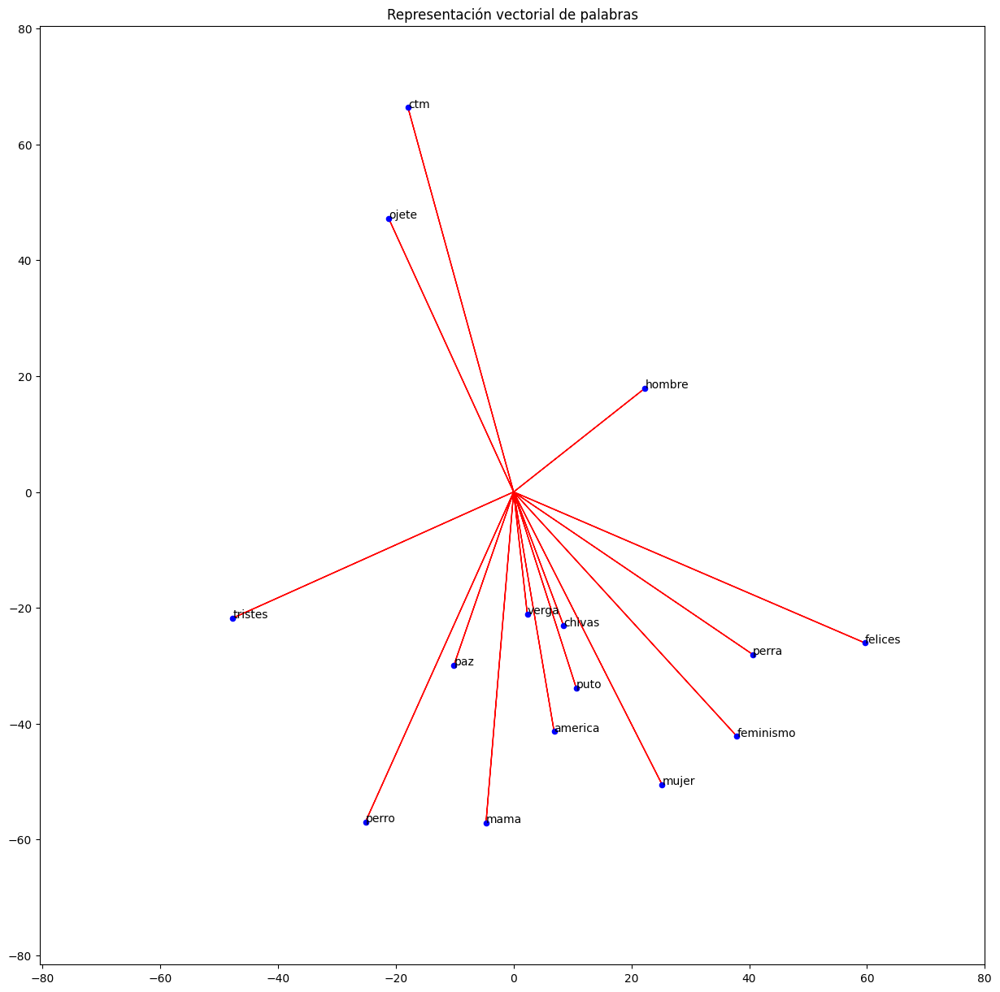

In [26]:
subset = ['america', 'cholo', 'puto', 'perro', 'chivas', 'mama', 'tristes', 'hombre', 
          'mujer', 'paz', 'perra', 'verga', 'ctm', 'felices', 'feminismo', 'ojete']
subset_arrow(reduced_RI, subset, dict_index)

Podemos observar como la nube de palabras es más homogenea, no se observan comulos, mientras que las representaciones vectoriales de las palabras también muestran un patrón distinto, las palabras como ctm y ojete se localizan en un sector superior izquierdo, tiene una mayor norma. Otro hecho intersante es que las palabras parecen cambiar de sentido (al opuesto) o de género casí con un ángulo de 90° entre ellas, lo que da el presentimiento de que en un espacio de dimensión superior estas estan en planos perpendiculares. 

### **3. Utilizar TCOR para clasificar documentos** 

In [50]:
def svm_pred(BOW_tr, y_tr, BOW_val, val_y):
    '''
      Muestra las predicciones del modelo
    '''
    parametros = {'C': [0.5, .12, .25, .5, 1, 2, 4]}
    
    clasificador = svm.LinearSVC(class_weight = 'balanced')  
    grid =  GridSearchCV(estimator = clasificador, param_grid = parametros, n_jobs = 8, scoring = "f1_macro",cv = 5)
    grid.fit(BOW_tr, y_tr)
    y_pred = grid.predict(BOW_val)

    p, r, f, _= precision_recall_fscore_support(val_y, y_pred, average='macro', pos_label=1)
    
    print(metrics.classification_report(val_y,y_pred, digits=4))
    conf_matrix = confusion_matrix(target_txt_val, y_pred)
    
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, 
                xticklabels=[0, 1], yticklabels=[0, 1])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()


              precision    recall  f1-score   support

           0     0.8182    0.8397    0.8288       418
           1     0.5759    0.5385    0.5566       169

    accuracy                         0.7530       587
   macro avg     0.6971    0.6891    0.6927       587
weighted avg     0.7484    0.7530    0.7504       587



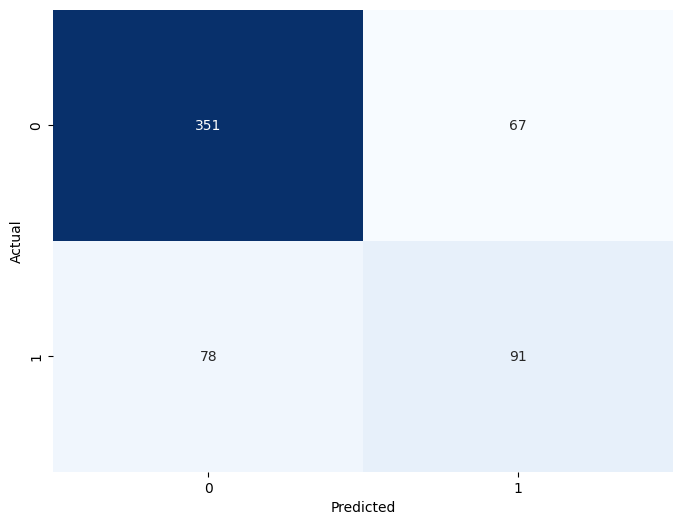

In [51]:
BoW_TFidf_train = BoW_tfidf(file_txt_train,V,dict_index)
BoW_TFidf_val   = BoW_tfidf(file_txt_val,V,dict_index)
svm_pred(BoW_TFidf_train,target_txt_train,BoW_TFidf_val,target_txt_val)

In [97]:
tcor_term = tcor_term(file_txt_train,dict_index)
tcor_doc = normalize(tcor_doc(file_txt_train, dict_index, tcor_term), norm='l2', axis=1)

In [95]:
tcor_term_val = tcor_term(file_txt_val,dict_index)
tcor_doc_val = normalize(tcor_doc(file_txt_val, dict_index, tcor_term_val), norm='l2', axis=1)

              precision    recall  f1-score   support

           0     0.8399    0.8158    0.8277       418
           1     0.5746    0.6154    0.5943       169

    accuracy                         0.7581       587
   macro avg     0.7072    0.7156    0.7110       587
weighted avg     0.7635    0.7581    0.7605       587



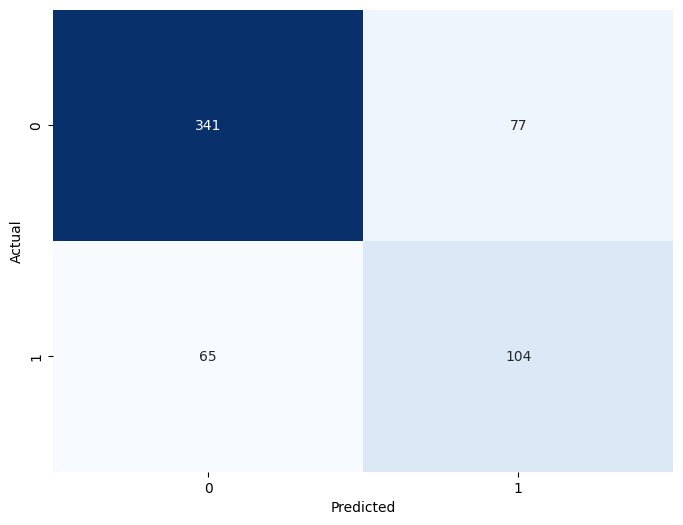

In [98]:
svm_pred(tcor_doc,target_txt_train,tcor_doc_val,target_txt_val)

En la siguiente tabla se muestran los resultados de clasifiación

| Método                           | Accuracy | Macro F1 | F1-score(0) | F1-score(1) |
|----------------------------------|----------|----------|------------|------------|
| **BoW TF-IDF**                    | 0.7530   | 0.6927   | 0.8288     | 0.5566     |
| **TCOR**        | 0.7581   | 0.7110   | 0.8277     | 0.5943     |


Por una diferencia mínima gana la implementación de la TCOR, dado a que escogimos todos los términos en la representación TCOR término-término, tenemos una matriz sparse, dado que no hacemos una seleccion de características no mejoramos mucho la tarea de clasificación, quiza hacer una selección de carácterísticas pueda mejorar los resultados. 

### **4. Mayor similitud de los 10 pares mas parecidas en la coleccion** 

In [76]:
def cosine_sim(tcor_term):
    """
    Calcula la similitud del coseno 
    """
    T = len(tcor_term)
    prod_punto = tcor_term @ tcor_term.T
    normas = np.linalg.norm(tcor_term, axis=1)
    mat_normas = np.outer(normas, normas) #producto interior 
    mat_normas[mat_normas == 0] = 1e-6
    coseno = prod_punto / mat_normas
    return coseno

In [77]:
coseno = cosine_sim(tcor_term)
indices = np.dstack(np.triu_indices_from(coseno, k=1))[0]  # Evita duplicados
top_10 = sorted(indices, key=lambda idx: coseno[idx[0], idx[1]], reverse=True)[:10]

print("\nTop 10 términos más similares:\n")
for i, (t1, t2) in enumerate(top_10, 1):
    print(f"{i}. {V[t1][1]} --- {V[t2][1]} | Similitud: {coseno[t1, t2]:.4f}")


Top 10 términos más similares:

1. Jonas --- Joe | Similitud: 1.0000
2. verguenza --- reniegan | Similitud: 1.0000
3. verguenza --- perversos | Similitud: 1.0000
4. verguenza --- ideología | Similitud: 1.0000
5. verguenza --- Psicopatología | Similitud: 1.0000
6. reniegan --- perversos | Similitud: 1.0000
7. reniegan --- ideología | Similitud: 1.0000
8. reniegan --- Psicopatología | Similitud: 1.0000
9. perversos --- ideología | Similitud: 1.0000
10. perversos --- Psicopatología | Similitud: 1.0000


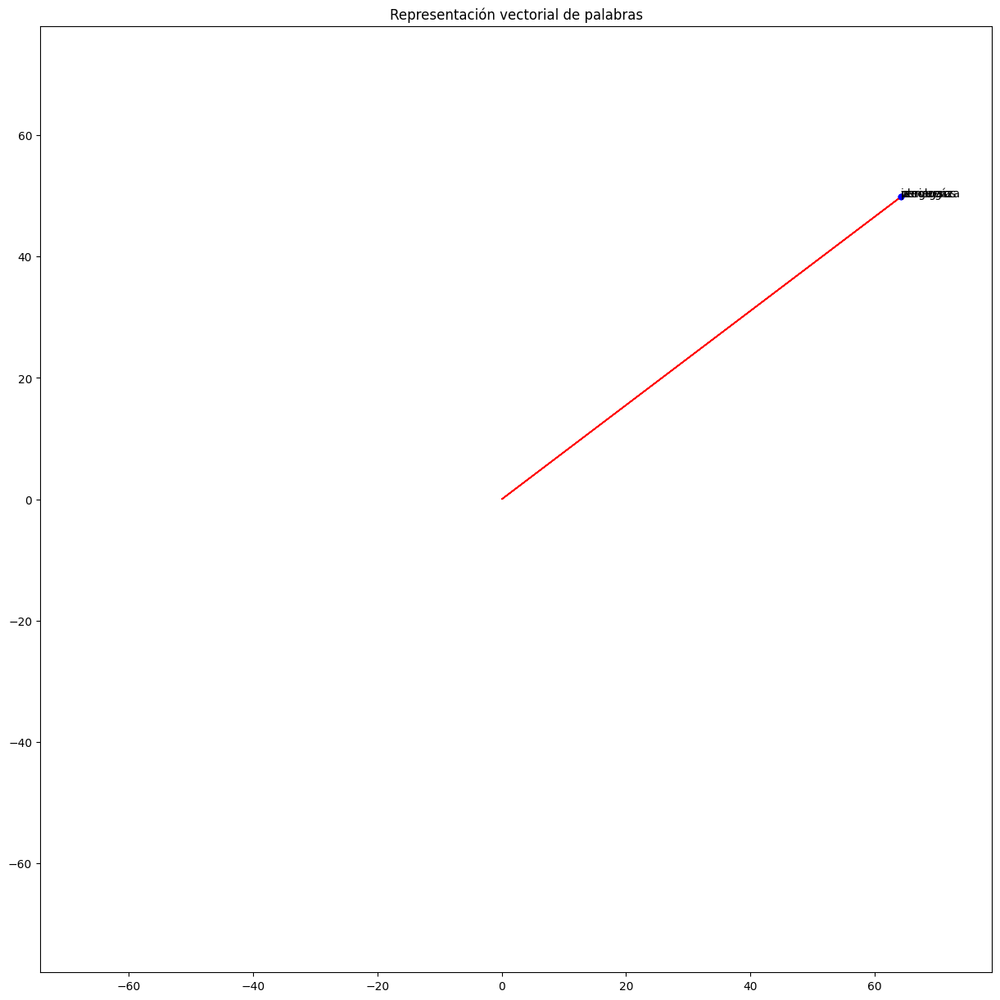

In [78]:
subset = ['verguenza', 'reniegan', 'ideología', 'perversos']

subset_arrow(reduced_tcor, subset, dict_index)

In [79]:
#comparando con sklearn 
from sklearn.metrics.pairwise import cosine_similarity

coseno = cosine_similarity(tcor_term)
indices = np.dstack(np.triu_indices_from(coseno, k=1))[0]
top_10 = sorted(indices, key=lambda idx: coseno[idx[0], idx[1]], reverse=True)[:10]

print("\nTop 10 términos más similares:\n")
for i, (t1, t2) in enumerate(top_10, 1):
    print(f"{i}. {V[t1][1]} --- {V[t2][1]} | Similitud: {coseno[t1, t2]:.4f}")


Top 10 términos más similares:

1. Jonas --- Joe | Similitud: 1.0000
2. Wars --- Star | Similitud: 1.0000
3. litros --- 500 | Similitud: 1.0000
4. Unidos --- Estados | Similitud: 1.0000
5. Ramos --- César | Similitud: 1.0000
6. Ramos --- Costly | Similitud: 1.0000
7. César --- Costly | Similitud: 1.0000
8. trump --- empleado | Similitud: 1.0000
9. trump --- Oooo | Similitud: 1.0000
10. promocional --- Sobreviviré | Similitud: 1.0000


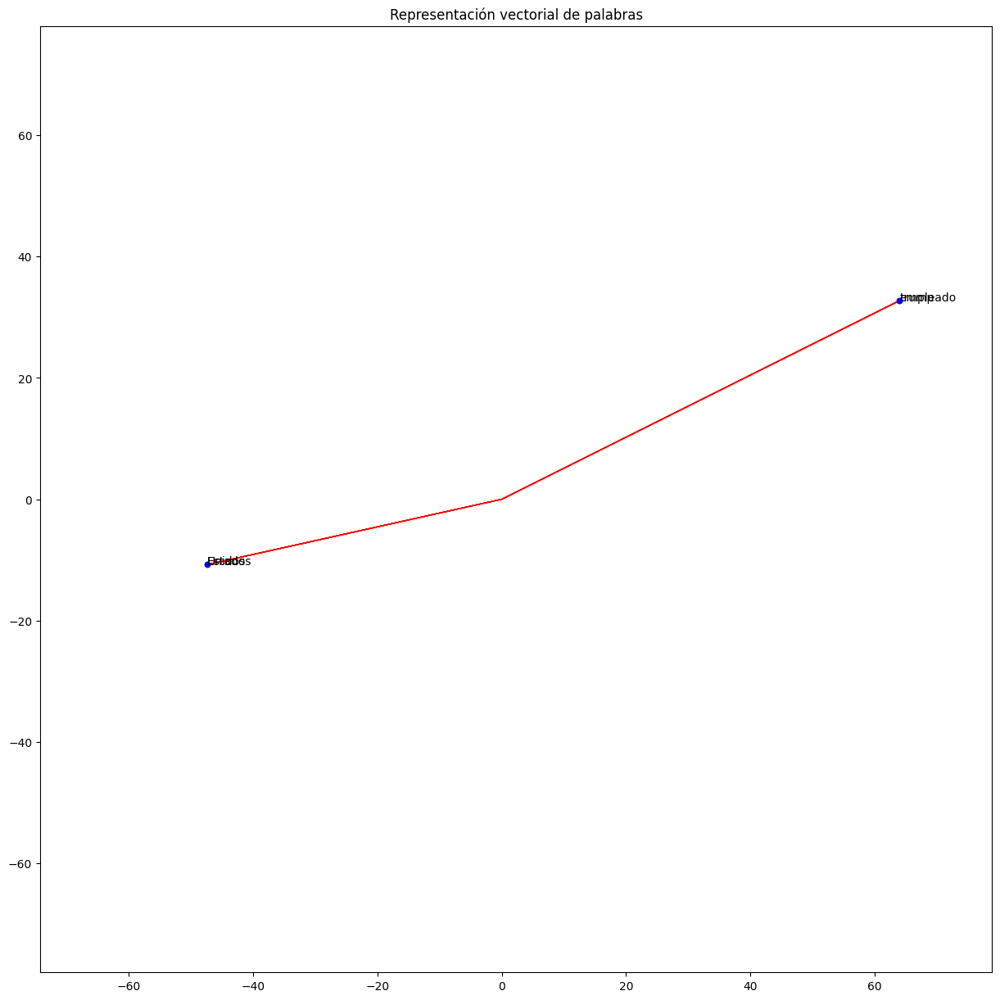

In [80]:
subset = ['Unidos', 'Estados', 'trump', 'empleado']

subset_arrow(reduced_tcor, subset, dict_index)

Los resultados con `sklearn` muestran pares de términos más variados y con asociaciones más intuitivas, como *"Unidos - Estados"* y *"Wars - Star"*. Esto sugiere que la implementación de `sklearn` maneja mejor la dispersión de los datos en comparación con la versión manual, que generaba muchos valores idénticos. Sin embargo, algunos pares extraños como *"trump - Oooo"* y *"promocional - Sobreviviré"* pueden surgir, esto ya que ocurren en el conjunto de datos en pocas ocasiones y en el mismo documento. 


### **5. Similaridad en documentos**

Utilizamos la representación de documento TF-IDF 

In [81]:
BoW_TFidf = BoW_tfidf(file_txt_train,V,dict_index)
coseno_matrix= cosine_sim(BoW_TFidf)
indices = np.dstack(np.triu_indices_from(coseno_matrix, k=1))[0]
coseno_sorted = sorted(indices, key=lambda idx: coseno_matrix[idx[0], idx[1]], reverse=True)

In [82]:
num_pairs = 10
valid_pairs = []
i = 0

while len(valid_pairs) < num_pairs and i < len(coseno_sorted):
    idx1, idx2 = coseno_sorted[i]
    doc1 = " ".join(file_txt_train[idx1])
    doc2 = " ".join(file_txt_train[idx2])

    # Verificar si un documento es un substring exacto del otro
    if doc1 in doc2 or doc2 in doc1:
        i += 1
        continue  # Saltar este par si es un substring

    valid_pairs.append((idx1, idx2))
    i += 1

for idx1, idx2 in valid_pairs:
    print("-" * 45 * 2)
    print(f"Documento {idx1 + 1}:")
    print("Texto:", " ".join(file_txt_train[idx1]))
    print("Clasificación:", ["No Agresivo", "Agresivo"][target_txt_train[idx1]])

    print("\nDocumento", idx2 + 1, ":")
    print("Texto:", " ".join(file_txt_train[idx2]))
    print("Clasificación:", ["No Agresivo", "Agresivo"][target_txt_train[idx2]])

    print("\nDistancia coseno:", coseno_matrix[idx1, idx2])
    print("-" * 45 * 2)
    print("\n")


------------------------------------------------------------------------------------------
Documento 886:
Texto: Jamás te vayas a dormir triste o enojado , duerme con una sonrisa y ten en mente esto : “ Valió madre este día , pero mañana será diferente ” .
Clasificación: No Agresivo

Documento 1916 :
Texto: Jamás te vayas a dormir triste o enojado , duerme con una sonrisa y ten en mente esto : “ Valió verga este día , pero mañana será diferente ” .
Clasificación: No Agresivo

Distancia coseno: 0.9937028663727788
------------------------------------------------------------------------------------------


------------------------------------------------------------------------------------------
Documento 306:
Texto: @USUARIO @USUARIO @USUARIO Puede que sea muy buey , lo seguro es que es uno de los lameculos preferidos del sistema …
Clasificación: Agresivo

Documento 2779 :
Texto: @USUARIO @USUARIO @USUARIO Puede que sea muy buey , lo seguro es que es uno de los lameculos preferidos del s

Los 10 pares de documentos más similares según la métrica de similitud coseno reflejan una alta coherencia en la representación TF-IDF. Los documentos más parecidos no solo comparten palabras clave, sino que también pertenecen en a la misma categoría. Sin embargo, sería interesante analizar si existe algún sesgo en la selección de términos o si algunos documentos comparten una estructura demasiado repetitiva, ya que por ejemplo: el documento 886y el 1916 es el mismo.

#### Comparación con sklearn

In [83]:
from sklearn.metrics.pairwise import cosine_similarity

coseno_matrix= cosine_similarity(BoW_TFidf)
indices = np.dstack(np.triu_indices_from(coseno_matrix, k=1))[0]
coseno_sorted = sorted(indices, key=lambda idx: coseno_matrix[idx[0], idx[1]], reverse=True)

# Ressultados con sklearn 
num_pairs = 10
valid_pairs = []
i = 0

while len(valid_pairs) < num_pairs and i < len(coseno_sorted):
    idx1, idx2 = coseno_sorted[i]
    doc1 = " ".join(file_txt_train[idx1])
    doc2 = " ".join(file_txt_train[idx2])

    # Verificar si un documento es un substring exacto del otro
    if doc1 in doc2 or doc2 in doc1:
        i += 1
        continue  # Saltar este par si es un substring

    valid_pairs.append((idx1, idx2))
    i += 1

for idx1, idx2 in valid_pairs:
    print("-" * 45 * 2)
    print(f"Documento {idx1 + 1}:")
    print("Texto:", " ".join(file_txt_train[idx1]))
    print("Clasificación:", ["No Agresivo", "Agresivo"][target_txt_train[idx1]])

    print("\nDocumento", idx2 + 1, ":")
    print("Texto:", " ".join(file_txt_train[idx2]))
    print("Clasificación:", ["No Agresivo", "Agresivo"][target_txt_train[idx2]])

    print("\nDistancia coseno:", coseno_matrix[idx1, idx2])
    print("-" * 45 * 2)
    print("\n")

------------------------------------------------------------------------------------------
Documento 886:
Texto: Jamás te vayas a dormir triste o enojado , duerme con una sonrisa y ten en mente esto : “ Valió madre este día , pero mañana será diferente ” .
Clasificación: No Agresivo

Documento 1916 :
Texto: Jamás te vayas a dormir triste o enojado , duerme con una sonrisa y ten en mente esto : “ Valió verga este día , pero mañana será diferente ” .
Clasificación: No Agresivo

Distancia coseno: 0.9937028663727785
------------------------------------------------------------------------------------------


------------------------------------------------------------------------------------------
Documento 306:
Texto: @USUARIO @USUARIO @USUARIO Puede que sea muy buey , lo seguro es que es uno de los lameculos preferidos del sistema …
Clasificación: Agresivo

Documento 2779 :
Texto: @USUARIO @USUARIO @USUARIO Puede que sea muy buey , lo seguro es que es uno de los lameculos preferidos del s

Nota: Ontenemos los mismos resultados

### **6. Ganancia de Información y WordCloud**

Utilizando la definición de la función IG (_Information Gain_) que se define como: 


\begin{align*}
IG(k_i, \mathcal{C}) = -\sum_{p=1}^L \left(
\frac{n_p}{N_t} \log\left(\frac{n_p}{N_t}\right) -
\frac{n_{i,p}}{N_t} \log\left(\frac{n_{i,p}}{n_i}\right) -
\frac{n_p - n_{i,p}}{N_t} \log\left(\frac{n_p - n_{i,p}}{N_t - n_i}\right)
\right)
\end{align*}

Para computar la función IG contruimos una Tabla de Incidencia Termino-Clase. 

In [113]:
def TC_IncidenceTable(file_txt_train, target_txt_train, dict_idx):
    '''
    Construye la tabla de incidencia término-clase.
        
    Returns:
        TCI: Tabla de incidencia término-clase (términos x clases).
        n_p (np.array): Número de documentos por clase.
    '''
    num_terms = len(dict_idx)
    num_classes = len(set(target_txt_train))
    
    TCI = np.zeros((num_terms, num_classes + 1), dtype=np.float64)  # +1 para el total
    n_p = np.zeros(num_classes, dtype=np.float64)
    
    # doc por clase
    for label in target_txt_train:
        n_p[label] += 1
    
    for doc, label in zip(file_txt_train, target_txt_train):
        terms_in_doc = set(term for term in doc if term in dict_idx)
        for term in terms_in_doc:
            term_idx = dict_idx[term]
            TCI[term_idx, label] += 1  
            TCI[term_idx, -1] += 1    
    
    return TCI, n_p


def inf_gain(text_train, TCI, n_p):
    '''
    Calcula la ganancia de información para cada término.
    '''
    N_t = len(text_train)
    V = TCI.shape[0]  
    IG = np.zeros(V)
    
    for i in range(V):  # iterar sobre ter
        for l in range(len(n_p)):  # iterar sobre clase
            term1 = (n_p[l] / N_t) * np.log2(n_p[l] / N_t)
            term2 = (TCI[i, l] / N_t) * np.log2(TCI[i, l] / TCI[i, -1]) if TCI[i, l] != 0 else 0
            term3 = ((n_p[l] - TCI[i, l]) / N_t) * np.log2((n_p[l] - TCI[i, l]) / (N_t - TCI[i, -1])) if (n_p[l] - TCI[i, l]) != 0 else 0
            IG[i] += term1 - term2 - term3
        
        IG[i] = -IG[i]
    
    return IG

In [93]:
V_10000 = create_vocab(file_txt_train, 10000)

dict_index = dict()
count = 0
for weight, word in V_10000:
    dict_index[word] = count
    count += 1

tc, n_p = TC_IncidenceTable(file_txt_train, target_txt_train, dict_index)
IG = inf_gain(file_txt_train, tc, n_p)

terms = list(dict_index.keys())
ig_values = list(IG)
term_ig_pairs = list(zip(terms, ig_values))
term_ig_sorted = sorted(term_ig_pairs, key=lambda x: x[1], reverse=True)

top_50 = term_ig_sorted[:50]
for term, ig in top_50:
    print(f"Término: {term}, IG: {ig}")

Término: loca, IG: 0.019804802017230838
Término: @USUARIO, IG: 0.018679354877376653
Término: hdp, IG: 0.017428866908860752
Término: HDP, IG: 0.016980445816967005
Término: pinche, IG: 0.016661100547635865
Término: me, IG: 0.014749479008812849
Término: tu, IG: 0.01456774954368284
Término: putos, IG: 0.014527467645918835
Término: maricon, IG: 0.012636223672819247
Término: pendejo, IG: 0.012573881283892252
Término: puta, IG: 0.011059594471652223
Término: hijo, IG: 0.010954450619313383
Término: mierda, IG: 0.010110556282579286
Término: estoy, IG: 0.008605680696132934
Término: mi, IG: 0.006820791316001218
Término: pinches, IG: 0.006283337095949859
Término: perra, IG: 0.006219941330209866
Término: golfa, IG: 0.006157525260255148
Término: pendejos, IG: 0.005719243610037672
Término: soy, IG: 0.005216863888807988
Término: lameculos, IG: 0.005169872753782501
Término: en, IG: 0.00510191913610708
Término: Pinche, IG: 0.005036301597894921
Término: Putos, IG: 0.004957004523820918
Término: putita, IG:

**WordCloud**

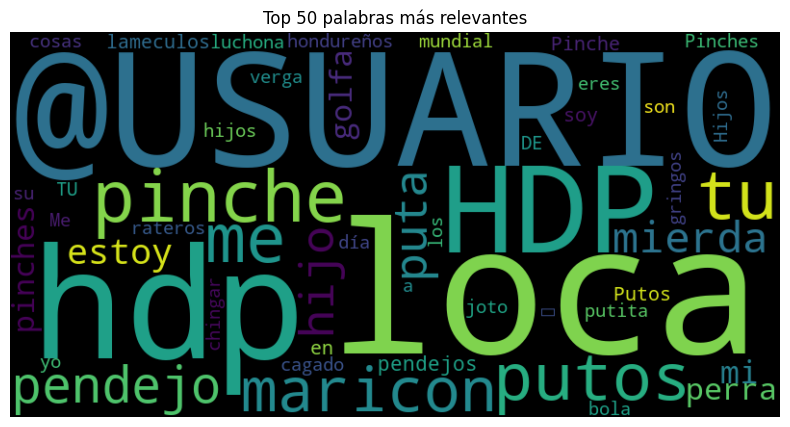

In [108]:
from wordcloud import WordCloud

word_ig_dict = {term: ig for term, ig in top_50}

wordcloud = WordCloud(width=800,height=400,background_color='black',  
    colormap='viridis', max_words=50, prefer_horizontal=0.9).generate_from_frequencies(word_ig_dict)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Top 50 palabras más relevantes")
plt.show()

In [111]:
wordcloud.to_file(os.path.join(os.getcwd(), "wordcloud.png"))

La nube de palabras generada refleja un vocabulario coloquial y ofensivo (comun en redesa sociales y más en México), con términos como "lameculos", "hijos", "pendejos" y "joto". Mientras mayor el tamano del término, mayor es la ganacia de información de ella, la cual nos ayuda a caracterizar la relacion término-documento ocurrencia con la usencia término-documento. 
